In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
df=pd.read_csv('/kc_house_data.csv')

In [ ]:
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [ ]:
df.isnull().sum()

id               0
date             0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
dtype: int64

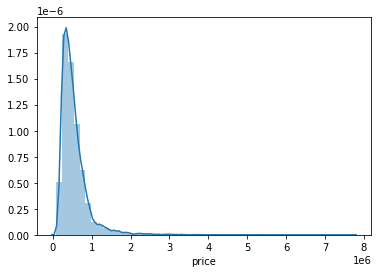

In [ ]:
sns.distplot(df['price'])

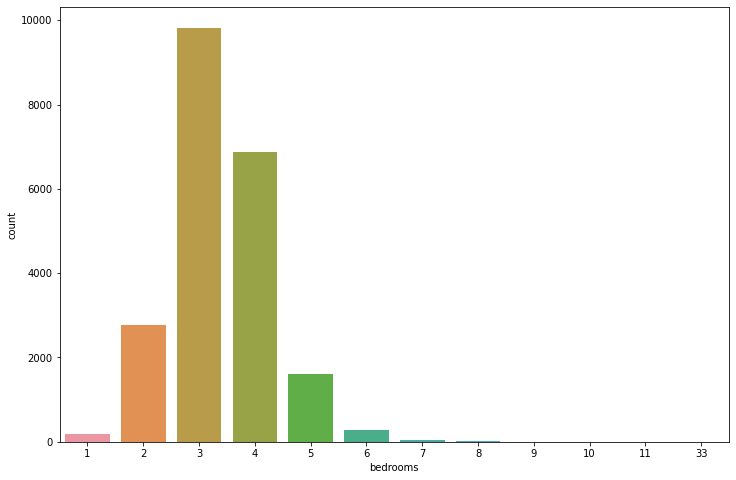

In [ ]:
plt.figure(figsize=(12,8))
sns.countplot(df['bedrooms'])

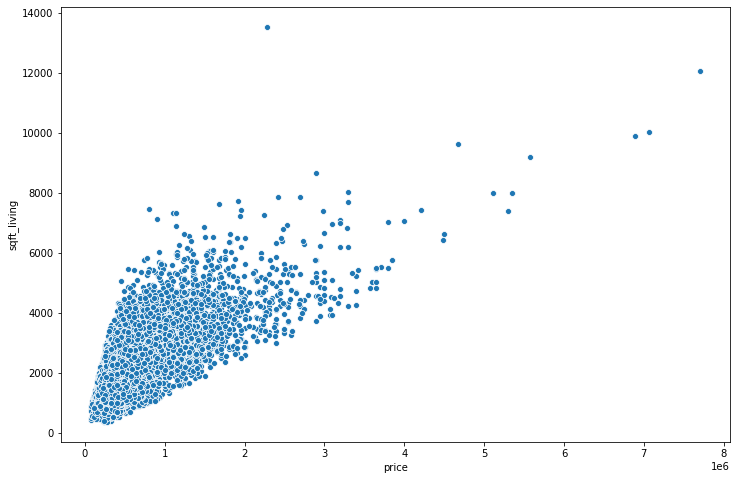

In [ ]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='price',y='sqft_living',data=df)

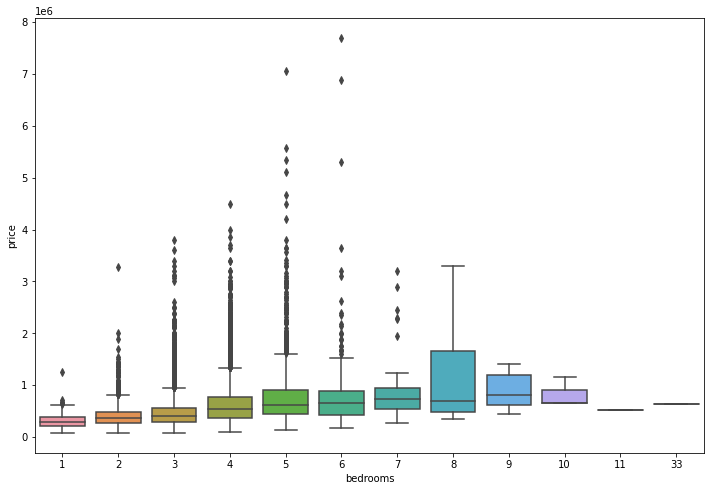

In [ ]:
plt.figure(figsize=(12,8))
sns.boxplot(x='bedrooms',y='price',data=df)

In [ ]:
!pip install folium

In [ ]:
import folium

In [ ]:
world_map=folium.Map()

In [ ]:
ofg=folium.map.FeatureGroup()
for lat,long in zip(df['lat'],df['long']):
  ofg.add_child(folium.CircleMarker([lat,long],
                                             radius=5,
                                             colour='red',
                                             fill_color='red'))
world_map.add_child(ofg)  

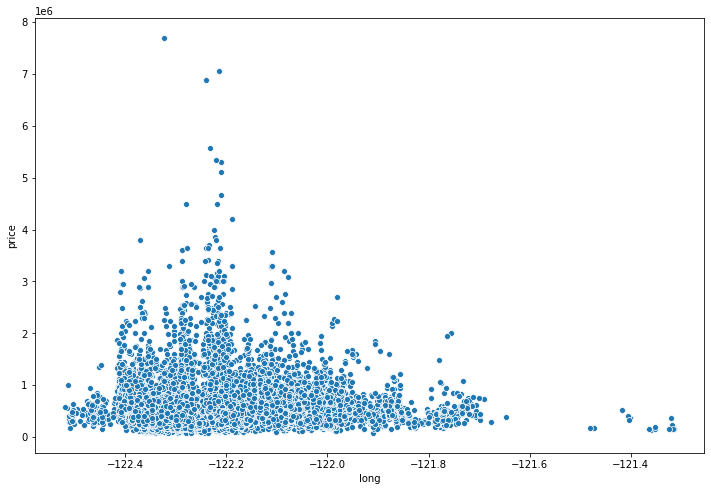

In [ ]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='long',y='price',data=df)

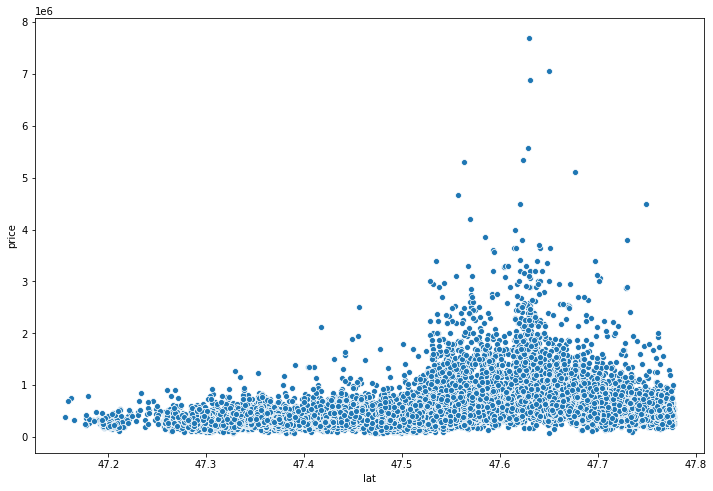

In [ ]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='lat',y='price',data=df)

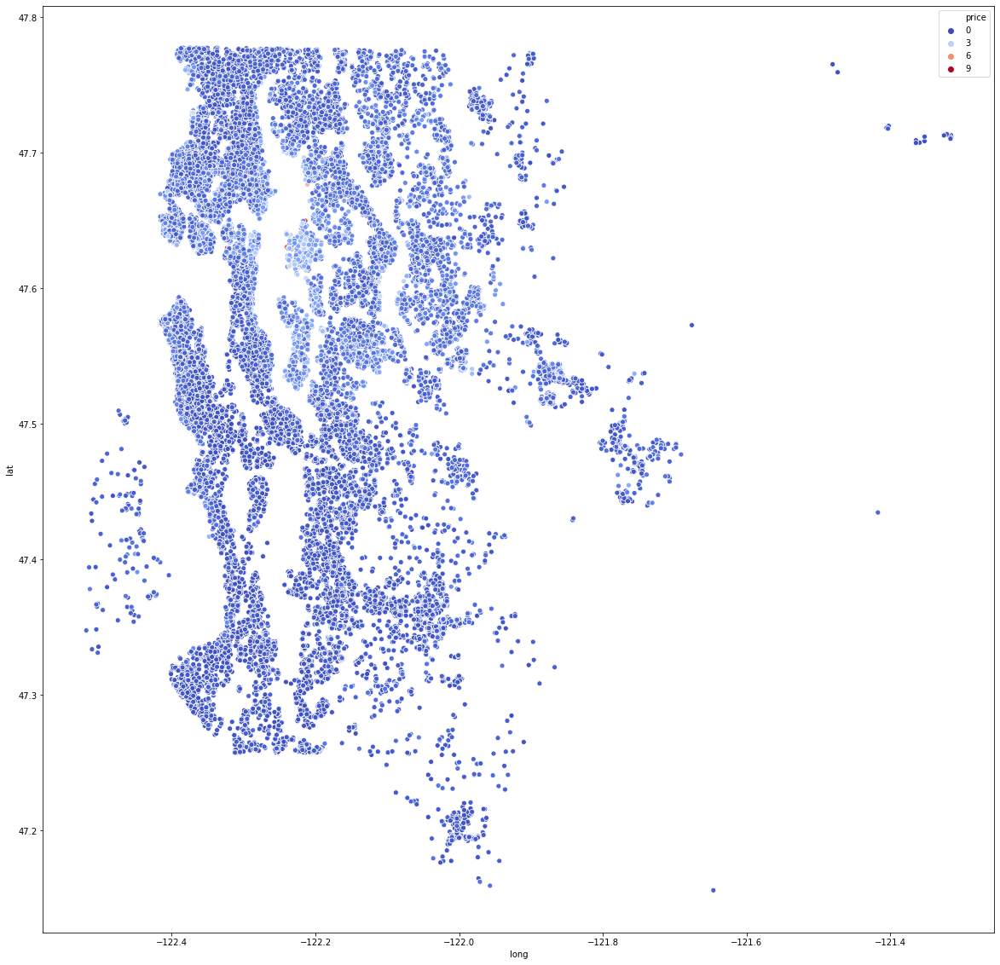

In [ ]:
plt.figure(figsize=(20,20))
sns.scatterplot(x='long',y='lat',data=df,hue='price',palette='coolwarm')

In [ ]:
df.sort_values('price',ascending=False).head(30)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
7245,6762700020,10/13/2014,7700000.0,6,8.00,12050,27600,2.5,0,3,4,13,8570,3480,1910,1987,98102,47.6298,-122.323,3940,8800
3910,9808700762,6/11/2014,7060000.0,5,4.50,10040,37325,2.0,1,2,3,11,7680,2360,1940,2001,98004,47.6500,-122.214,3930,25449
9245,9208900037,9/19/2014,6890000.0,6,7.75,9890,31374,2.0,0,4,3,13,8860,1030,2001,0,98039,47.6305,-122.240,4540,42730
4407,2470100110,8/4/2014,5570000.0,5,5.75,9200,35069,2.0,0,0,3,13,6200,3000,2001,0,98039,47.6289,-122.233,3560,24345
1446,8907500070,4/13/2015,5350000.0,5,5.00,8000,23985,2.0,0,4,3,12,6720,1280,2009,0,98004,47.6232,-122.220,4600,21750
1313,7558700030,4/13/2015,5300000.0,6,6.00,7390,24829,2.0,1,4,4,12,5000,2390,1991,0,98040,47.5631,-122.210,4320,24619
1162,1247600105,10/20/2014,5110000.0,5,5.25,8010,45517,2.0,1,4,3,12,5990,2020,1999,0,98033,47.6767,-122.211,3430,26788
8085,1924059029,6/17/2014,4670000.0,5,6.75,9640,13068,1.0,1,4,3,12,4820,4820,1983,2009,98040,47.5570,-122.210,3270,10454
2624,7738500731,8/15/2014,4500000.0,5,5.50,6640,40014,2.0,1,4,3,12,6350,290,2004,0,98155,47.7493,-122.280,3030,23408
8629,3835500195,6/18/2014,4490000.0,4,3.00,6430,27517,2.0,0,0,3,12,6430,0,2001,0,98004,47.6208,-122.219,3720,14592


## we see that our price range mostly from 1 to 3 lacs.So  we can remove the outliers from our data


# ***Removing outliers***

In [ ]:
len(df)

21597

In [ ]:
len(df)*0.01

215.97

# *We will remove top 1%*

In [ ]:
non_top1_percent=df.sort_values('price',ascending=False).iloc[216:]

In [ ]:
non_top1_percent

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
6329,824059321,6/2/2014,1970000.0,4,3.50,4370,8510,2.0,0,1,3,10,3610,760,2003,0,98004,47.5876,-122.204,2960,10347
12271,1923000260,10/15/2014,1960000.0,5,4.50,6200,23373,3.0,0,1,4,11,5050,1150,1988,0,98040,47.5632,-122.215,3700,14486
9166,3124059023,2/13/2015,1960000.0,3,1.75,3330,12566,1.0,1,4,4,8,1940,1390,1960,0,98040,47.5287,-122.220,3730,16560
12565,2806300065,4/22/2015,1960000.0,4,4.00,4430,31353,2.0,0,0,3,12,4430,0,1998,0,98005,47.6422,-122.157,3900,35237
1150,4055701200,4/21/2015,1960000.0,4,2.75,3120,7898,1.0,1,4,4,8,1560,1560,1963,0,98034,47.7165,-122.259,2630,13868
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2139,1623049041,5/8/2014,82500.0,2,1.00,520,22334,1.0,0,0,2,5,520,0,1951,0,98168,47.4799,-122.296,1572,10570
8267,3883800011,11/5/2014,82000.0,3,1.00,860,10426,1.0,0,0,3,6,860,0,1954,0,98146,47.4987,-122.341,1140,11250
16184,3028200080,3/24/2015,81000.0,2,1.00,730,9975,1.0,0,0,1,5,730,0,1943,0,98168,47.4808,-122.315,860,9000
465,8658300340,5/23/2014,80000.0,1,0.75,430,5050,1.0,0,0,2,4,430,0,1912,0,98014,47.6499,-121.909,1200,7500


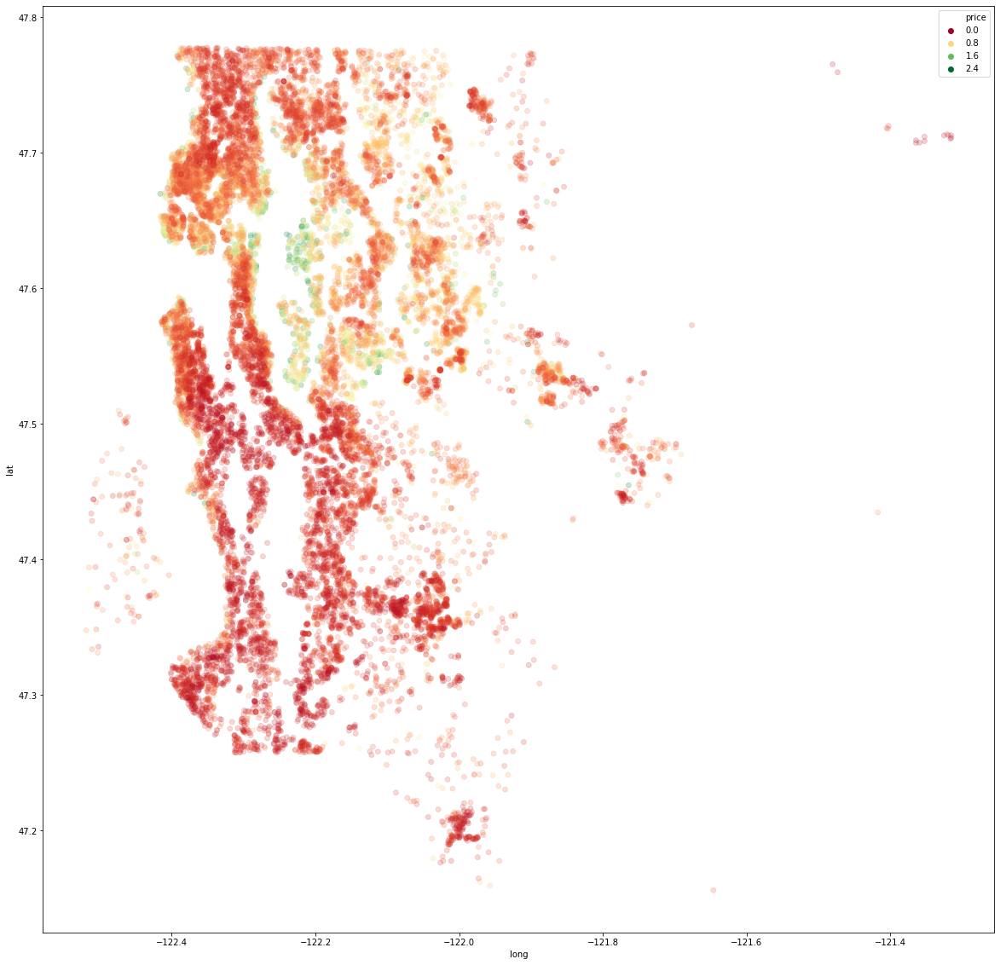

In [ ]:
plt.figure(figsize=(20,20))
sns.scatterplot(x='long',y='lat',data=non_top1_percent,edgecolor=None,alpha=0.2,hue='price',palette='RdYlGn')

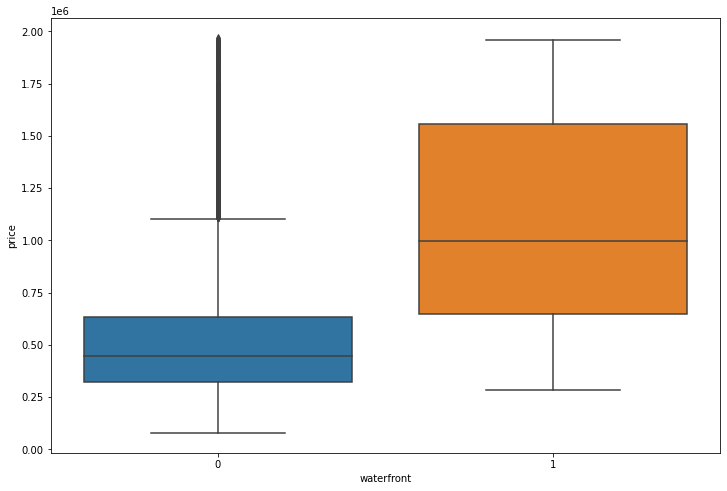

In [ ]:
plt.figure(figsize=(12,8))
sns.boxplot(x='waterfront',y='price',data=non_top1_percent)


## **Feature Engineering**

In [ ]:
non_top1_percent.drop('id',axis=1,inplace=True)

In [ ]:
non_top1_percent

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
6329,6/2/2014,1970000.0,4,3.50,4370,8510,2.0,0,1,3,10,3610,760,2003,0,98004,47.5876,-122.204,2960,10347
12271,10/15/2014,1960000.0,5,4.50,6200,23373,3.0,0,1,4,11,5050,1150,1988,0,98040,47.5632,-122.215,3700,14486
9166,2/13/2015,1960000.0,3,1.75,3330,12566,1.0,1,4,4,8,1940,1390,1960,0,98040,47.5287,-122.220,3730,16560
12565,4/22/2015,1960000.0,4,4.00,4430,31353,2.0,0,0,3,12,4430,0,1998,0,98005,47.6422,-122.157,3900,35237
1150,4/21/2015,1960000.0,4,2.75,3120,7898,1.0,1,4,4,8,1560,1560,1963,0,98034,47.7165,-122.259,2630,13868
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2139,5/8/2014,82500.0,2,1.00,520,22334,1.0,0,0,2,5,520,0,1951,0,98168,47.4799,-122.296,1572,10570
8267,11/5/2014,82000.0,3,1.00,860,10426,1.0,0,0,3,6,860,0,1954,0,98146,47.4987,-122.341,1140,11250
16184,3/24/2015,81000.0,2,1.00,730,9975,1.0,0,0,1,5,730,0,1943,0,98168,47.4808,-122.315,860,9000
465,5/23/2014,80000.0,1,0.75,430,5050,1.0,0,0,2,4,430,0,1912,0,98014,47.6499,-121.909,1200,7500


In [ ]:
non_top1_percent['date']=pd.to_datetime(non_top1_percent['date'])

In [ ]:
non_top1_percent

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
6329,2014-06-02,1970000.0,4,3.50,4370,8510,2.0,0,1,3,10,3610,760,2003,0,98004,47.5876,-122.204,2960,10347
12271,2014-10-15,1960000.0,5,4.50,6200,23373,3.0,0,1,4,11,5050,1150,1988,0,98040,47.5632,-122.215,3700,14486
9166,2015-02-13,1960000.0,3,1.75,3330,12566,1.0,1,4,4,8,1940,1390,1960,0,98040,47.5287,-122.220,3730,16560
12565,2015-04-22,1960000.0,4,4.00,4430,31353,2.0,0,0,3,12,4430,0,1998,0,98005,47.6422,-122.157,3900,35237
1150,2015-04-21,1960000.0,4,2.75,3120,7898,1.0,1,4,4,8,1560,1560,1963,0,98034,47.7165,-122.259,2630,13868
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2139,2014-05-08,82500.0,2,1.00,520,22334,1.0,0,0,2,5,520,0,1951,0,98168,47.4799,-122.296,1572,10570
8267,2014-11-05,82000.0,3,1.00,860,10426,1.0,0,0,3,6,860,0,1954,0,98146,47.4987,-122.341,1140,11250
16184,2015-03-24,81000.0,2,1.00,730,9975,1.0,0,0,1,5,730,0,1943,0,98168,47.4808,-122.315,860,9000
465,2014-05-23,80000.0,1,0.75,430,5050,1.0,0,0,2,4,430,0,1912,0,98014,47.6499,-121.909,1200,7500


In [ ]:
non_top1_percent['year']=non_top1_percent['date'].apply(lambda x:x.year)
non_top1_percent['month']=non_top1_percent['date'].apply(lambda x:x.month)

In [ ]:
non_top1_percent.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month
6329,2014-06-02,1970000.0,4,3.50,4370,8510,2.0,0,1,3,10,3610,760,2003,0,98004,47.5876,-122.204,2960,10347,2014,6
12271,2014-10-15,1960000.0,5,4.50,6200,23373,3.0,0,1,4,11,5050,1150,1988,0,98040,47.5632,-122.215,3700,14486,2014,10
9166,2015-02-13,1960000.0,3,1.75,3330,12566,1.0,1,4,4,8,1940,1390,1960,0,98040,47.5287,-122.220,3730,16560,2015,2
12565,2015-04-22,1960000.0,4,4.00,4430,31353,2.0,0,0,3,12,4430,0,1998,0,98005,47.6422,-122.157,3900,35237,2015,4
1150,2015-04-21,1960000.0,4,2.75,3120,7898,1.0,1,4,4,8,1560,1560,1963,0,98034,47.7165,-122.259,2630,13868,2015,4


In [ ]:
non_top1_percent.corr()['price'].sort_values(ascending=False)

price            1.000000
grade            0.680634
sqft_living      0.678717
sqft_living15    0.602252
sqft_above       0.583757
bathrooms        0.507692
lat              0.364436
view             0.343710
bedrooms         0.315243
sqft_basement    0.284659
floors           0.279140
waterfront       0.143594
yr_renovated     0.119732
sqft_lot         0.098535
sqft_lot15       0.088468
yr_built         0.063608
long             0.041848
condition        0.036132
year             0.005513
month           -0.014382
zipcode         -0.045944
Name: price, dtype: float64

In [ ]:
non_top1_percent['current_year']=2020
non_top1_percent.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month,current_year
6329,2014-06-02,1970000.0,4,3.50,4370,8510,2.0,0,1,3,10,3610,760,2003,0,98004,47.5876,-122.204,2960,10347,2014,6,2020
12271,2014-10-15,1960000.0,5,4.50,6200,23373,3.0,0,1,4,11,5050,1150,1988,0,98040,47.5632,-122.215,3700,14486,2014,10,2020
9166,2015-02-13,1960000.0,3,1.75,3330,12566,1.0,1,4,4,8,1940,1390,1960,0,98040,47.5287,-122.220,3730,16560,2015,2,2020
12565,2015-04-22,1960000.0,4,4.00,4430,31353,2.0,0,0,3,12,4430,0,1998,0,98005,47.6422,-122.157,3900,35237,2015,4,2020
1150,2015-04-21,1960000.0,4,2.75,3120,7898,1.0,1,4,4,8,1560,1560,1963,0,98034,47.7165,-122.259,2630,13868,2015,4,2020


In [ ]:
non_top1_percent['years_old']=non_top1_percent['current_year']-non_top1_percent['year']
non_top1_percent.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month,current_year,years_old
6329,2014-06-02,1970000.0,4,3.50,4370,8510,2.0,0,1,3,10,3610,760,2003,0,98004,47.5876,-122.204,2960,10347,2014,6,2020,6
12271,2014-10-15,1960000.0,5,4.50,6200,23373,3.0,0,1,4,11,5050,1150,1988,0,98040,47.5632,-122.215,3700,14486,2014,10,2020,6
9166,2015-02-13,1960000.0,3,1.75,3330,12566,1.0,1,4,4,8,1940,1390,1960,0,98040,47.5287,-122.220,3730,16560,2015,2,2020,5
12565,2015-04-22,1960000.0,4,4.00,4430,31353,2.0,0,0,3,12,4430,0,1998,0,98005,47.6422,-122.157,3900,35237,2015,4,2020,5
1150,2015-04-21,1960000.0,4,2.75,3120,7898,1.0,1,4,4,8,1560,1560,1963,0,98034,47.7165,-122.259,2630,13868,2015,4,2020,5


In [ ]:
non_top1_percent.corr()['price'].sort_values(ascending=False)

price            1.000000
grade            0.680634
sqft_living      0.678717
sqft_living15    0.602252
sqft_above       0.583757
bathrooms        0.507692
lat              0.364436
view             0.343710
bedrooms         0.315243
sqft_basement    0.284659
floors           0.279140
waterfront       0.143594
yr_renovated     0.119732
sqft_lot         0.098535
sqft_lot15       0.088468
yr_built         0.063608
long             0.041848
condition        0.036132
year             0.005513
years_old       -0.005513
month           -0.014382
zipcode         -0.045944
current_year          NaN
Name: price, dtype: float64

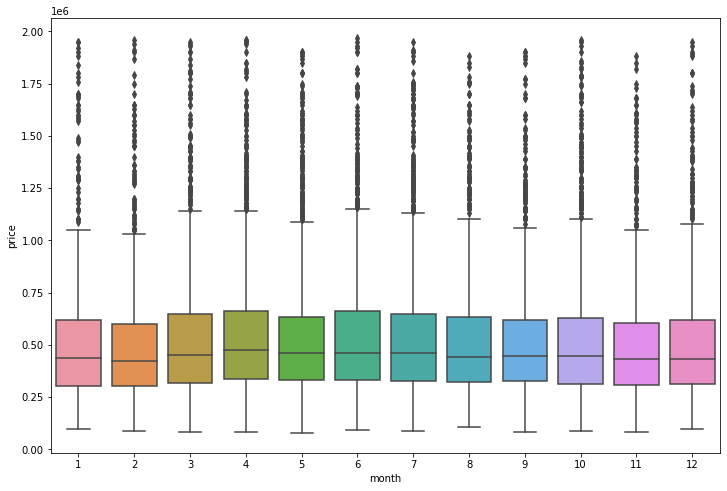

In [ ]:
plt.figure(figsize=(12,8))
sns.boxplot(x='month',y='price',data=non_top1_percent)

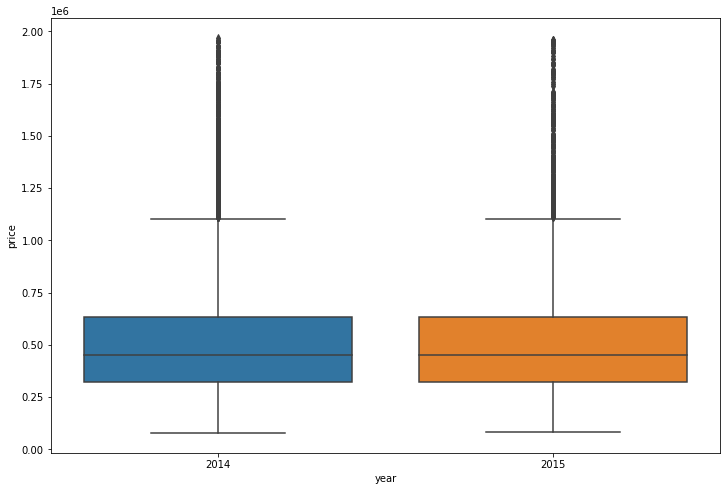

In [ ]:
plt.figure(figsize=(12,8))
sns.boxplot(x='year',y='price',data=non_top1_percent)

In [ ]:
non_top1_percent.groupby('month').mean()['price']

month
1     504981.466942
2     493269.607114
3     523761.809164
4     541452.515165
5     522940.482570
6     533429.116009
7     526694.006390
8     511327.311946
9     507255.324601
10    519494.580247
11    499781.279770
12    503406.086598
Name: price, dtype: float64

In [ ]:
non_top1_percent.groupby('year').mean()['price']

year
2014    517282.707004
2015    520642.628712
Name: price, dtype: float64

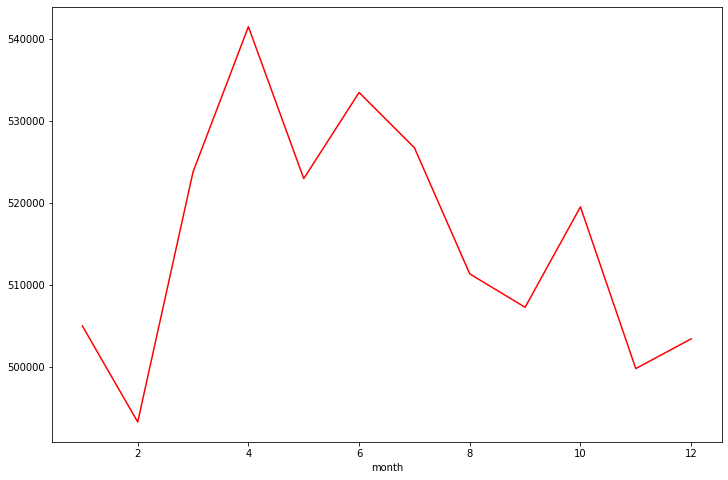

In [ ]:
plt.figure(figsize=(12,8))
non_top1_percent.groupby('month').mean()['price'].plot(color='red')


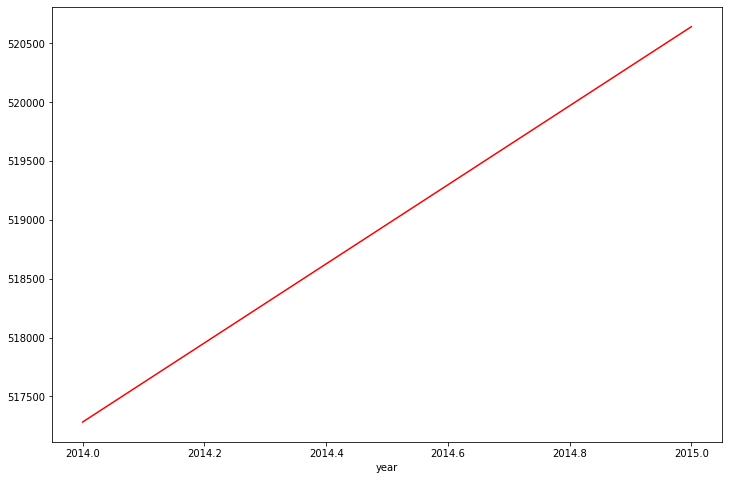

In [ ]:
plt.figure(figsize=(12,8))
non_top1_percent.groupby('year').mean()['price'].plot(color='red')

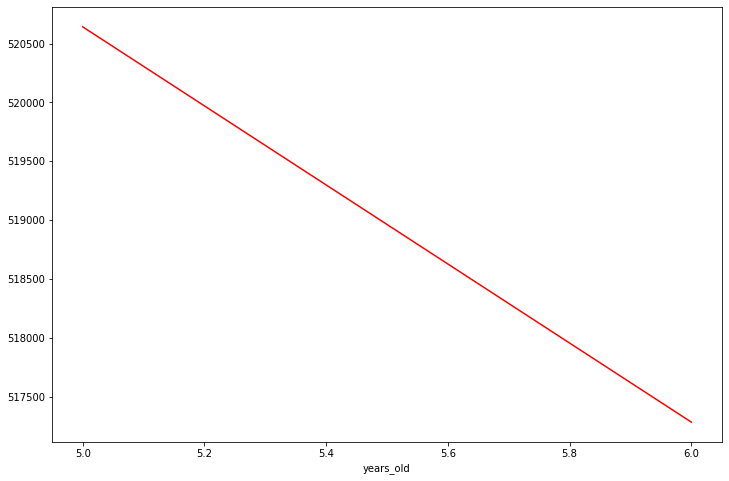

In [ ]:
plt.figure(figsize=(12,8))
non_top1_percent.groupby('years_old').mean()['price'].plot(color='red')

In [ ]:
non_top1_percent.drop(['date','current_year'],axis=1,inplace=True)


In [ ]:
non_top1_percent.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month,years_old
6329,1970000.0,4,3.50,4370,8510,2.0,0,1,3,10,3610,760,2003,0,98004,47.5876,-122.204,2960,10347,2014,6,6
12271,1960000.0,5,4.50,6200,23373,3.0,0,1,4,11,5050,1150,1988,0,98040,47.5632,-122.215,3700,14486,2014,10,6
9166,1960000.0,3,1.75,3330,12566,1.0,1,4,4,8,1940,1390,1960,0,98040,47.5287,-122.220,3730,16560,2015,2,5
12565,1960000.0,4,4.00,4430,31353,2.0,0,0,3,12,4430,0,1998,0,98005,47.6422,-122.157,3900,35237,2015,4,5
1150,1960000.0,4,2.75,3120,7898,1.0,1,4,4,8,1560,1560,1963,0,98034,47.7165,-122.259,2630,13868,2015,4,5


In [ ]:
non_top1_percent['zipcode'].value_counts()

98103    602
98038    589
98115    582
98052    573
98117    553
        ... 
98010    100
98102     99
98024     80
98148     57
98039     29
Name: zipcode, Length: 70, dtype: int64

In [ ]:
non_top1_percent['yr_renovated'].value_counts()

0       20499
2014       91
2013       36
2007       34
2000       34
        ...  
1959        1
1954        1
1948        1
1944        1
1951        1
Name: yr_renovated, Length: 70, dtype: int64

In [ ]:
 non_top1_percent.drop('zipcode',axis=1,inplace=True)

In [ ]:
def yr_renovated_func(x):
  if (x==0):
    non_top1_percent['not_renovated']=0
  else:
    non_top1_percent['renovated']=1
non_top1_percent['yr_renovated'].apply(yr_renovated_func)



6329     None
12271    None
9166     None
12565    None
1150     None
         ... 
2139     None
8267     None
16184    None
465      None
15279    None
Name: yr_renovated, Length: 21381, dtype: object

In [ ]:
non_top1_percent['yr_renovated'].value_counts()

0       20499
2014       91
2013       36
2007       34
2000       34
        ...  
1959        1
1954        1
1948        1
1944        1
1951        1
Name: yr_renovated, Length: 70, dtype: int64

In [ ]:
non_top1_percent.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,year,month,years_old,not_renovated,renovated
6329,1970000.0,4,3.50,4370,8510,2.0,0,1,3,10,3610,760,2003,0,47.5876,-122.204,2960,10347,2014,6,6,0,1
12271,1960000.0,5,4.50,6200,23373,3.0,0,1,4,11,5050,1150,1988,0,47.5632,-122.215,3700,14486,2014,10,6,0,1
9166,1960000.0,3,1.75,3330,12566,1.0,1,4,4,8,1940,1390,1960,0,47.5287,-122.220,3730,16560,2015,2,5,0,1
12565,1960000.0,4,4.00,4430,31353,2.0,0,0,3,12,4430,0,1998,0,47.6422,-122.157,3900,35237,2015,4,5,0,1
1150,1960000.0,4,2.75,3120,7898,1.0,1,4,4,8,1560,1560,1963,0,47.7165,-122.259,2630,13868,2015,4,5,0,1


In [ ]:
non_top1_percent.columns

Index(['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'lat', 'long',
       'sqft_living15', 'sqft_lot15', 'year', 'month', 'years_old',
       'not_renovated', 'renovated'],
      dtype='object')

In [ ]:
non_top1_percent.drop('yr_renovated',axis=1,inplace=True)

In [ ]:
non_top1_percent.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,lat,long,sqft_living15,sqft_lot15,year,month,years_old,not_renovated,renovated
6329,1970000.0,4,3.50,4370,8510,2.0,0,1,3,10,3610,760,2003,47.5876,-122.204,2960,10347,2014,6,6,0,1
12271,1960000.0,5,4.50,6200,23373,3.0,0,1,4,11,5050,1150,1988,47.5632,-122.215,3700,14486,2014,10,6,0,1
9166,1960000.0,3,1.75,3330,12566,1.0,1,4,4,8,1940,1390,1960,47.5287,-122.220,3730,16560,2015,2,5,0,1
12565,1960000.0,4,4.00,4430,31353,2.0,0,0,3,12,4430,0,1998,47.6422,-122.157,3900,35237,2015,4,5,0,1
1150,1960000.0,4,2.75,3120,7898,1.0,1,4,4,8,1560,1560,1963,47.7165,-122.259,2630,13868,2015,4,5,0,1


# **Model Training**

In [ ]:
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

In [ ]:
X=non_top1_percent.drop('price',axis=1).values
y=non_top1_percent['price'].values

In [ ]:
train_test_split?


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=101)
print('training size',X_train.shape,y_train.shape)
print('test size',X_test.shape,y_test.shape)

training size (14966, 21) (14966,)
test size (6415, 21) (6415,)


In [ ]:
from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler()

In [ ]:
X_train=scaler.fit_transform(X_train)
X_test=scaler.transform(X_test)

In [ ]:
model=Sequential()

model.add(Dense(21,activation='relu'))
model.add(Dense(21,activation='relu'))
model.add(Dense(21,activation='relu'))
model.add(Dense(21,activation='relu'))

model.add(Dense(1))

model.compile(optimizer='adam',loss='mse')

In [ ]:
model.fit(x=X_train,y=y_train,epochs=500,validation_data=(X_test,y_test),batch_size=128)

Epoch 1/500
117/117 [==============================] - 0s 3ms/step - loss: 346851278848.0000 - val_loss: 356731977728.0000
Epoch 2/500
117/117 [==============================] - 0s 2ms/step - loss: 344462229504.0000 - val_loss: 348408938496.0000
Epoch 3/500
117/117 [==============================] - 0s 2ms/step - loss: 313776177152.0000 - val_loss: 279546986496.0000
Epoch 4/500
117/117 [==============================] - 0s 2ms/step - loss: 193533329408.0000 - val_loss: 114521989120.0000
Epoch 5/500
117/117 [==============================] - 0s 2ms/step - loss: 72022261760.0000 - val_loss: 58825596928.0000
Epoch 6/500
117/117 [==============================] - 0s 2ms/step - loss: 57051938816.0000 - val_loss: 57303400448.0000
Epoch 7/500
117/117 [==============================] - 0s 2ms/step - loss: 55966433280.0000 - val_loss: 56223154176.0000
Epoch 8/500
117/117 [==============================] - 0s 2ms/step - loss: 54887133184.0000 - val_loss: 55129624576.0000
Epoch 9/500
117/117 [===

In [ ]:
losses=pd.DataFrame(model.history.history)

In [ ]:
losses

,loss,val_loss
0,3.468513e+11,3.567320e+11
1,3.444622e+11,3.484089e+11
2,3.137762e+11,2.795470e+11
3,1.935333e+11,1.145220e+11
4,7.202226e+10,5.882560e+10
...,...,...
495,1.968767e+10,2.044633e+10
496,1.965135e+10,2.041925e+10
497,1.964787e+10,2.044203e+10
498,1.965779e+10,2.042281e+10


<Figure size 1440x576 with 0 Axes>

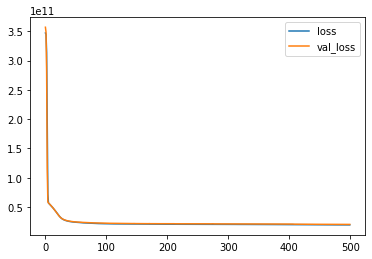

In [ ]:
plt.figure(figsize=(20,8))
losses.plot()

In [ ]:
print(X_test.shape)
predict=model.predict(X_test)

(6415, 21)


In [ ]:
predict

array([[833305.06],
       [556298.1 ],
       [444430.22],
       ...,
       [476768.03],
       [438737.16],
       [615043.25]], dtype=float32)

In [ ]:
model.evaluate(X_test,y_test)

201/201 [==============================] - 0s 816us/step - loss: 20508256256.0000


20508256256.0

# **Evaluation**

In [ ]:
from sklearn.metrics import mean_absolute_error,mean_squared_error,explained_variance_score,r2_score

In [ ]:
print(' mean absolute error',mean_absolute_error(y_test,predict))
print(' mean squared error',mean_squared_error(y_test,predict))
print('explained_variance_score',explained_variance_score(y_test,predict))
print(' r2_score',r2_score(y_test,predict))

 mean absolute error 95147.82013225838
 mean squared error 20508260197.390278
explained_variance_score 0.7522094647074121
 r2_score 0.7510722568694985


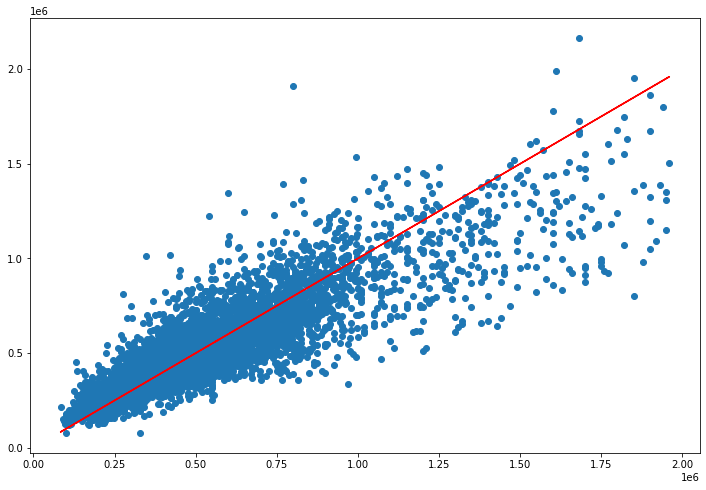

In [ ]:
plt.figure(figsize=(12,8))
plt.scatter(y_test,predict)
plt.plot(y_test,y_test,'-r')

In [ ]:
from tensorflow.keras.models import load_model

In [ ]:
model.save('kingcountry_houseprice.h5')

In [ ]:
single_data=non_top1_percent.drop('price',axis=1).iloc[0]

In [ ]:
single_data

bedrooms             4.0000
bathrooms            3.5000
sqft_living       4370.0000
sqft_lot          8510.0000
floors               2.0000
waterfront           0.0000
view                 1.0000
condition            3.0000
grade               10.0000
sqft_above        3610.0000
sqft_basement      760.0000
yr_built          2003.0000
lat                 47.5876
long              -122.2040
sqft_living15     2960.0000
sqft_lot15       10347.0000
year              2014.0000
month                6.0000
years_old            6.0000
not_renovated        0.0000
renovated            1.0000
Name: 6329, dtype: float64

In [ ]:
single_data=scaler.transform(single_data.values.reshape(-1,21))

In [ ]:
my_model=load_model('kingcountry_houseprice.h5')

In [ ]:
my_model.predict(single_data)

array([[1101834.]], dtype=float32)

# **Comparing the prediction with Multiple Linear Regression**

In [ ]:
from sklearn.linear_model import LinearRegression

In [ ]:
lr_model=LinearRegression()

In [ ]:
lr_model.fit(X_train,y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [ ]:
predict_lr=lr_model.predict(X_test)

In [ ]:
print(' mean absolute error',mean_absolute_error(y_test,predict_lr))
print(' mean squared error',mean_squared_error(y_test,predict_lr))
print('explained_variance_score',explained_variance_score(y_test,predict_lr))
print(' r2_score',r2_score(y_test,predict_lr))

 mean absolute error 107036.84957131723
 mean squared error 23812439872.4795
explained_variance_score 0.7110022672214218
 r2_score 0.7109663687297381


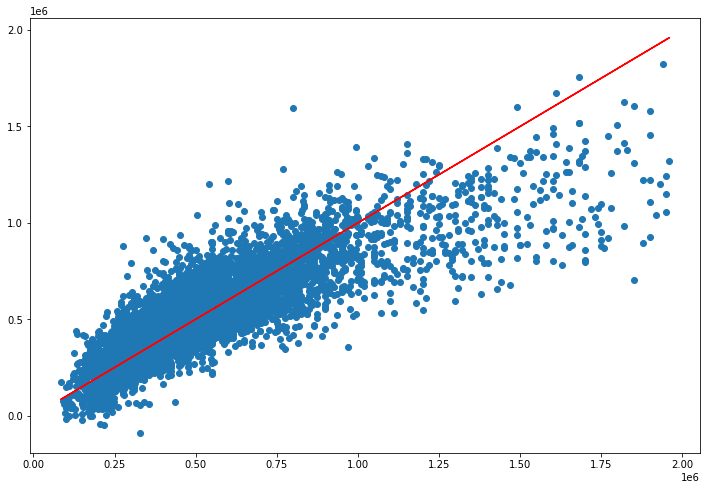

In [ ]:
plt.figure(figsize=(12,8))
plt.scatter(y_test,predict_lr)
plt.plot(y_test,y_test,'-r')